## Calibrate Camera
- Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
- Apply a distortion correction to raw images.

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from random import randint
from sklearn.metrics import mean_squared_error
print('libaries imported')

libaries imported


3 Images out of total 20 Images that were used for Calibration


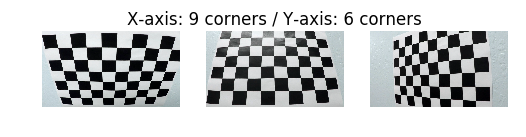

Undistorted Image Examples


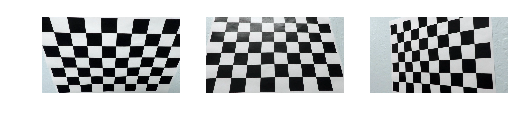

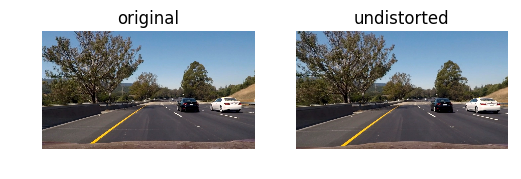

In [2]:
### Loading Calibration Images, generate Calibration-Variables, define Undistortion-Function

##Load the 20 Calibration Images provided with the project repository
cal_images=[]
for i in range(20) :
    i=i+1
    cal_images.append(cv2.imread('./camera_cal/calibration'+str(i)+'.jpg'))

##Show 3 Calibration Images
print('3 Images out of total 20 Images that were used for Calibration')
for i in range(3):
    plt.figure(0)
    plt.subplot(1,3,i+1) ; plt.imshow(cal_images[i+1]) ; plt.axis('off')
    if i==1:
        plt.title('X-axis: 9 corners / Y-axis: 6 corners')
plt.show()

##Finding Chessboard Corners, adapted from (c)lesson 10
#Number of corners on chessboard
corners_x = 9
corners_y = 6
#Prepare and Add Object and Image points, (c)lesson 10
objp=np.zeros((corners_y*corners_x, 3), np.float32)
objp[:,:2]=np.mgrid[0:corners_x, 0:corners_y].T.reshape(-1,2)
object_p=[]
image_p=[]
for i in range(len(cal_images)):
    cal_gray=cv2.cvtColor(cal_images[i], cv2.COLOR_BGR2GRAY) #cv2.findChessboardCorners() needs grayscale image
    ret, corners = cv2.findChessboardCorners(cal_gray, (corners_x, corners_y), None)
    if ret==True:
        object_p.append(objp)
        image_p.append(corners)
        #cal_gray=cv2.drawChessboardCorners(cal_gray, (corners_x,corners_y), corners, ret)
        #plt.figure(1)
        #plt.imshow(cal_gray, cmap='gray')
        #plt.show()
        
###################################################       
## Undistort-Function, adapted from (c)lesson 10 ##
###################################################
def undistort(image,object_p=object_p,image_p=image_p):
    image_gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_p, image_p, image_gray.shape[::-1], None, None)
    image = cv2.undistort(image, mtx, dist, None, mtx)
    return image
#====================================================================================================================#
        
        
                        
print('Undistorted Image Examples')
for i in range(3):
    plt.figure(1)
    plt.subplot(1,3,i+1) ; plt.imshow(undistort(cal_images[i+1],object_p,image_p),cmap='gray'); plt.axis('off')    
plt.show()

plt.figure(2)
image=cv2.cvtColor(cv2.imread('./test_images/test6.jpg'), cv2.COLOR_BGR2RGB)
plt.subplot(1,2,1); plt.imshow(image) ; plt.title('original'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(undistort(image,object_p,image_p)) ; plt.title('undistorted'); plt.axis('off')
plt.show()

---
## Extract / Isolate Lane related Pixels

- Threshold of single Colourchannel
- Combined Sobel-based Gradient for X- and Y-axis, Magnitude of the Gradient and Direction of the Gradient



In [4]:
##############################################
## Definition of Lane-Extraction Functions  ##
##############################################

#Each function can be applied to a specific colourchannel via the argument 'channel'
#If only the grayscaled image should be used, set 'channel=3'

#=========================================================================================================#
# Threshold of the Colour-Channel, adapted by(c) lesson 30 #
############################################################
def col_thresh(img,channel=3,thresh=(0,255)):
    if channel<3:
        colour_channel=img[:,:,channel]
    else:
        colour_channel=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    colour_binary = np.zeros_like(colour_channel)
    colour_binary[(colour_channel >= thresh[0]) & (colour_channel <= thresh[1])] = 1
    return colour_binary

#=========================================================================================================#
# Sobel Threshold, adapted by(c) solution lesson 21 #
#####################################################
def abs_sobel_thresh(img, channel=3, orient='x', thresh=(0,255)):
    if channel<3:
        img=img[:,:,channel]
    else:
        img=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # Return the result
    return binary_output
#_________________________________________________________________________________________________________#
# Magnitude of the Gradient, adapted by(c) solution lesson 22 #
###############################################################
def mag_thresh(img, channel=3, sobel_kernel=3, thresh=(0,255)):
    if channel<3:
        img=img[:,:,channel]
    else:
        img=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)        
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1
    # Return the binary image
    return binary_output
#_________________________________________________________________________________________________________#
# Direction of the Gradient, adapted by(c) solution lesson 23 #
###############################################################
def dir_thresh(img, channel=3, sobel_kernel=3, thresh=(0, np.pi/2)):
    if channel<3:
        img=img[:,:,channel]
    else:
        img=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, apply a threshold and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    # Return the binary image
    return binary_output
#=========================================================================================================#
# Combination of the sobel based extractions, adapted by(c) solution lesson 24 #
################################################################################
def sobel_combination(img, channel=3, ksize=3, X_thresh=(0,255), Y_thresh=(0,255),
                      ma_thresh=(0,255), di_thresh=(0, np.pi/2)):
    gradx_bin = abs_sobel_thresh(img, channel, orient='x', thresh=(X_thresh[0],X_thresh[1]))
    grady_bin = abs_sobel_thresh(img, channel, orient='y', thresh=(Y_thresh[0],Y_thresh[1]))
    mag_bin   = mag_thresh(img, channel, ksize, (ma_thresh[0],ma_thresh[1]))
    dir_bin   = dir_thresh(img, channel, ksize, (di_thresh[0],di_thresh[1]))
    combined = np.zeros_like(dir_bin)
    combined[((gradx_bin == 1) & (grady_bin == 1)) + ((gradx_bin == 1)&(mag_bin == 1) & (dir_bin == 1))] = 1
    return combined


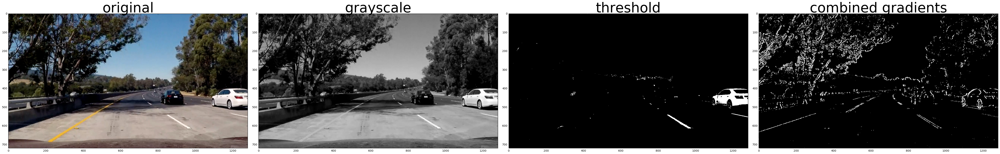

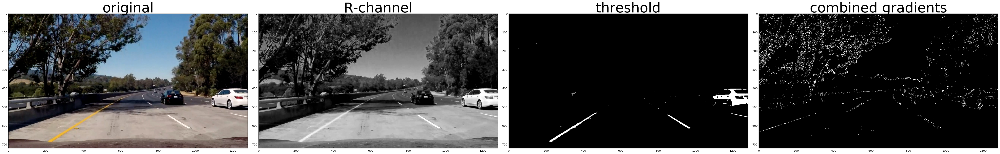

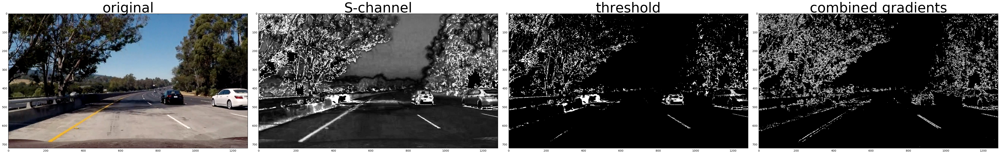

In [4]:
# Test and evaluation of differnet colourchannels, -spaces and combinations
original_image=cv2.imread('./test_images/test5.jpg')

image        =cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
threshold_img=col_thresh(original_image,3,(195,255))
combined_img =sobel_combination(original_image,3,15,(20,240),(30,240),(50,240),(0.13,1.18))
#show grayscale extractions
f1 , (ax1,ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(50, 9))
f1.tight_layout()
ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
ax1.set_title('original', fontsize=50)
ax2.imshow(image, cmap='gray')
ax2.set_title('grayscale', fontsize=50)
ax3.imshow(threshold_img, cmap='gray')
ax3.set_title('threshold', fontsize=50)
ax4.imshow(combined_img, cmap='gray')
ax4.set_title('combined gradients', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

threshold_img=col_thresh(original_image,2,(220,255))
combined_img =sobel_combination(original_image,2,15,(30,90),(20,255),(90,200),(0.03,1.0))
#show R-channel extractions of BGR-space
f2 , (ax1,ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(50, 9))
f2.tight_layout()
ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
ax1.set_title('original', fontsize=50)
ax2.imshow(original_image[:,:,2], cmap='gray')
ax2.set_title('R-channel', fontsize=50)
ax3.imshow(threshold_img, cmap='gray')
ax3.set_title('threshold', fontsize=50)
ax4.imshow(combined_img, cmap='gray')
ax4.set_title('combined gradients', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

image        =(cv2.cvtColor(original_image, cv2.COLOR_BGR2HLS))
threshold_img=col_thresh(image,2,(230,255))
combined_img =sobel_combination(image,2,15,(24,255),(40,255),(95,250),(0.83,2.0))
#show S-channel extractions of HLS-space
f3 , (ax1,ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(50, 9))
f3.tight_layout()
ax1.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
ax1.set_title('original', fontsize=50)
ax2.imshow(image[:,:,2], cmap='gray')
ax2.set_title('S-channel', fontsize=50)
ax3.imshow(threshold_img, cmap='gray')
ax3.set_title('threshold', fontsize=50)
ax4.imshow(combined_img, cmap='gray')
ax4.set_title('combined gradients', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

After testing on the testimages different threshold sets to detect the lane lines robust for all test images, I decided to use the R-channel of the BGR-Colourspace for the threshold and a Combination of the sobel-based gradients with this form:

    gradientcombination =[X-gradient AND Y-gradient] OR [X-gradient AND Magnitude-gradient AND Direction-gradient]
    overall = gradientcombination OR OR R-Threshold

---
### The overall Lane-Extraction Function

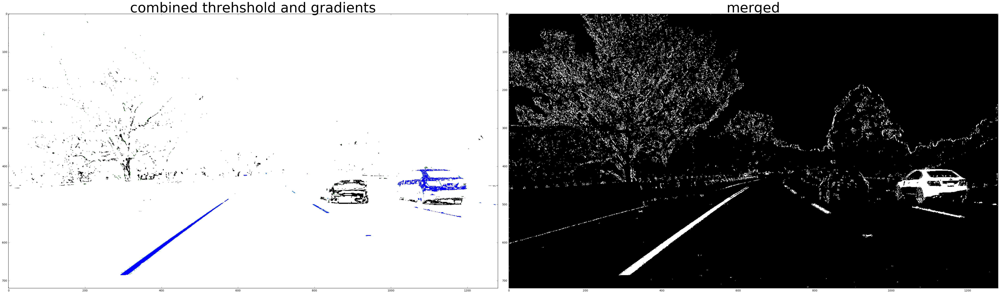

In [5]:
##########################################
## The overall Lane-Extraction Function ##
##########################################
def binary_lanes(image):
    # Sobel based Gradients computed on R-channel of BGR-Colourspace
    combined_img_R =sobel_combination(image,2,15,(30,90),(20,255),(90,200),(0.03,1.0))
    # Threshold of R-Channel
    threshold_img_R=col_thresh(image,2,(230,255))
    # Threshold of S-channel of HLS-Colourspace
    #threshold_img_S=col_thresh(cv2.cvtColor(image, cv2.COLOR_BGR2HLS),2,(230,255))
    # Merge both binary pixel-extractions
    extractions_merged = np.zeros_like(threshold_img_R)
    extractions_merged[(threshold_img_R == 1) | (combined_img_R == 1)] = 1  #(threshold_img_S == 1) |
    return extractions_merged
#==================================================================================================================# 
    
## Visualize
image=cv2.imread('./test_images/test6.jpg')
# Stack each channel to view their individual contributions
combined_img_R =sobel_combination(image,2,15,(30,90),(20,255),(90,200),(0.03,1.0))
threshold_img_R=col_thresh(image,2,(230,255))
threshold_img_S=col_thresh(cv2.cvtColor(image, cv2.COLOR_BGR2HLS),2,(230,255))
extracions_combined = np.dstack(( np.zeros_like(combined_img_R), combined_img_R, threshold_img_R,threshold_img_S))
# Combine the two binary thresholds
extractions_merged = binary_lanes(image)
# Plotting thresholded images
f1, (ax1, ax2) = plt.subplots(1, 2, figsize=(50,20))
f1.tight_layout()
ax1.imshow(extracions_combined)
ax1.set_title('combined threhshold and gradients', fontsize=50)
ax2.imshow(extractions_merged, cmap='gray')
ax2.set_title('merged', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

---
## Perspective Transformation 

- Identify the Transformation Matrix via drawing a Trapezoid on an (undistorted) Image with straight and plane lane lines
- Transform the Image to Birds-Eye-View


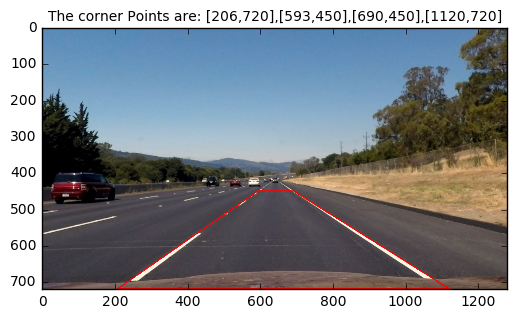

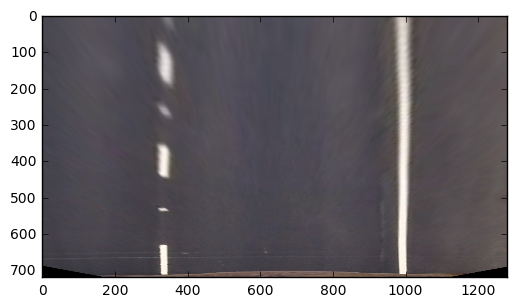

In [6]:
############################# 
## Transformation-Function ##
#############################
def lane_transform(image):
    points_source= np.array([[206,720],[593,450],[690,450],[1120,720]],np.float32)
    points_desti = np.array([[326,720],  [326,0], [1000,0],[1000,720]],np.float32)
    trans_matrix = cv2.getPerspectiveTransform(points_source, points_desti)
    image = cv2.warpPerspective(image, trans_matrix, (image.shape[1],image.shape[0]), flags=cv2.INTER_LINEAR)
    return image
#==================================================================================================================#
###################################### 
## Undo the Transformation-Function ##
######################################
def un_lane_transform(image):
    points_source= np.array([[326,720],  [326,0], [1000,0],[1000,720]],np.float32)
    points_desti = np.array([[206,720],[593,450],[690,450],[1120,720]],np.float32)
    trans_matrix = cv2.getPerspectiveTransform(points_source, points_desti)
    image = cv2.warpPerspective(image, trans_matrix, (image.shape[1],image.shape[0]), flags=cv2.INTER_LINEAR)
    return image
#==================================================================================================================#

## Draw a trapezoid on the image to identify the corners of the transformation matrix used in the function
image= undistort(cv2.cvtColor(cv2.imread('./test_images/straight_lines2.jpg'), cv2.COLOR_BGR2RGB))
image= cv2.line(image,(206,720), (593,450),(255,0,0),2)
image= cv2.line(image,(593,450), (690,450),(255,0,0),2)
image= cv2.line(image,(690,450),(1120,720),(255,0,0),2)
image= cv2.line(image,(206,718),(1120,718),(255,0,0),2)
plt.imshow(image)
plt.title('The corner Points are: [206,720],[593,450],[690,450],[1120,720]', fontsize=10)
plt.show()

image = lane_transform(undistort(cv2.cvtColor(cv2.imread('./test_images/straight_lines2.jpg'), cv2.COLOR_BGR2RGB)))
plt.imshow(image) ; plt.show()

## Identify where the Lane Lines are

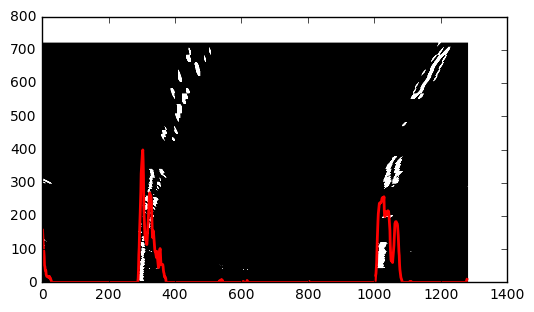

In [7]:
##################################################
## Lane Line Start and direction of their Slope ##
##################################################
def detect_lane_start_direction(image):
    offset=80
    histogram = np.sum(image[image.shape[0]//2:,:], axis=0)
    # The Maximum of each side of the Histogram indicate the "start" of a lane line. Use this as a starting point:
    # (c) lesson 33
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # To identify wether it is a right slope or left slope, compute the mean value of an area around the local maxima
    # According to the image dimensions and test images, a reasonable area would be around OFFSET=80px in each direction.
    left_mean=np.mean(histogram[(leftx_base-offset):(leftx_base+offset)])
    right_mean=np.mean(histogram[(rightx_base-offset):(rightx_base+offset)])
    # Now identify, on which side more values are above a mean-based threshold are.
    # The slope is in the direction of the side with a higher number. Left-Slope=1, Right-Slope=-1

    #Left
    l_datapoints=len(np.where(histogram[(leftx_base-offset):(leftx_base)]>left_mean/3)[0])
    r_datapoints=len(np.where(histogram[(leftx_base):(leftx_base+offset)]>left_mean/3)[0])

    if l_datapoints>r_datapoints:
        leftx_slope=1
    else:
        leftx_slope=-1
    #Right
    l_datapoints=len(np.where(histogram[(rightx_base-offset):(rightx_base)]>right_mean/3)[0])
    r_datapoints=len(np.where(histogram[(rightx_base):(rightx_base+offset)]>right_mean/3)[0])
    # The slope is in the direction of the side with a higher number. Left=-1, Right=1
    if l_datapoints>r_datapoints:
        rightx_slope=1
    else:
        rightx_slope=-1
        
    output=[leftx_base,rightx_base,leftx_slope,rightx_slope]
    return output
#===========================================================================================================#

# load test image
image=cv2.imread('./test_images/test5.jpg')
# Extract Lane Pixels, perspective transform the binary image
image=lane_transform(binary_lanes(undistort(image)))

# Create histogram to identify where the lanes are, (c) lesson 33
histogram = np.sum(image[image.shape[0]//2:,:], axis=0)*3

#Plot (scaled) Histogramm over Lanelines
fig, ax = plt.subplots()
ax.imshow(image, extent=[0, 1280, 0, 720], cmap='gray')
ax.plot(histogram, linewidth=2, color='red')
plt.show()

In [8]:
########################################################
## Modified Sliding Windows, adapted by (c) lesson 33 ##
########################################################
def detect_lane(image, number_of_windows=7, search_width=100, minimum_pixels=50):
    #detect start of lanelines and their direction of slope
    leftx_base,rightx_base,leftx_slope,rightx_slope=detect_lane_start_direction(image)
    # Choose the number of sliding windows
    nwindows = number_of_windows
    # Set height of windows
    window_height = np.int(image.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = search_width
    # Set minimum number of pixels found to recenter window
    minpix = minimum_pixels
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = image.shape[0] - (window+1)*window_height
        win_y_high = image.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        out_img = np.dstack((image, image, image))*255
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds  = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                           (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position,
        # if it fullfills the direction of the slope. If not, there are most likely pixel-artifacts that are not the
        # laneline therefore recentering on the mean position would be not correct. Adjust the next window with the
        # gradient between the last two windows.
        # And if there is not the minimum number of pixels found, then the same adjustment applies.
        if len(good_left_inds) > minpix:
            leftx_new = np.int(np.mean(nonzerox[good_left_inds]))
            #check if new position will be plausibel regarding the lane-slope
            if leftx_slope*leftx_new<leftx_current*leftx_slope:
                leftx_new=leftx_new
            #if not, use gradient of last two windows and add it to current window in regards to the slope
            elif window>0:
                leftx_new=leftx_current+(leftx_before-leftx_current)*leftx_slope
            else:
                leftx_new=leftx_current
        elif window>0:
            leftx_new=leftx_current+(leftx_before-leftx_current)*leftx_slope
        else:
            leftx_new=leftx_current

                    
        leftx_before=leftx_current
        leftx_current=leftx_new
       
        if len(good_right_inds) > minpix:        
            rightx_new = np.int(np.mean(nonzerox[good_right_inds]))
            #check if new position will be plausibel regarding the lane-slope
            if leftx_slope*rightx_new<rightx_current*rightx_slope:
                rightx_new=rightx_new
            #if not, use gradient of last two windows and add it to current window in regards to the slope
            elif window>0:
                rightx_new=rightx_current+(rightx_before-rightx_current)*rightx_slope
            else:
                rightx_new=rightx_current
        elif window>0:
            rightx_new=rightx_current+(rightx_before-rightx_current)*rightx_slope
        else:
            rightx_new=rightx_current
                    
        rightx_before=rightx_current
        rightx_current=rightx_new
        
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    output=[leftx,lefty , rightx,righty , left_lane_inds,right_lane_inds , nonzerox,nonzeroy]
    return output
#____________________________________________________________________________________________________________#

##############################################################################################
## Search LaneLines in a Margin around already detected LaneLines, adapted by (c) lesson 33 ##
##############################################################################################
def margin_lane(image, margin=100, left_lane_inds=[], right_lane_inds=[], left_fit=[], right_fit=[]):
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds  = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) &
                       (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) &
                       (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    output=[leftx,lefty , rightx,righty , left_lane_inds,right_lane_inds , nonzerox,nonzeroy]
    return output

In [9]:
## Fit a second order polynomial to each Lane
## Check if new predicted laneline is roughly the same as the old one. An MSE of 400 is round about a difference of
## 20pixels of the whole curve which is round about 120mm on the road (~3000mm lane/~1000px)!
## In reality, correct predictions should only vary a bit at the end of the curve or if the car swerves.

## Also check whether the slope in the starting point matches the frame before. In reality the lanes in the nearfield
## should be nearly straight, except the car turns in a lane coming at an angle. Also both lane lines should have
## matching slopes.

def lane_polyfit(leftx=[],lefty=[] , rightx=[],righty=[] ,left_fit=[],right_fit=[] ,
                 left_slope=np.float64(0.0),right_slope=np.float64(0.0) , check=[1], error_counter=0):
    alert_slope=[0,0]
    alert_mse  =[0,0]
    left_fit_new  = np.polyfit(lefty, leftx, 2)   #f(y)=x
    right_fit_new = np.polyfit(righty, rightx, 2) #f(y)=x
    
    #=================================================================# 
    ### Sanity Check ###
    #compute X value of new laneline starting points, but a bit distance to the bottom for stability
    #leftx_base = left_fit_new[0]*650**2 + left_fit_new[1]*650 + left_fit_new[2]
    #rightx_base= right_fit_new[0]*650**2 + right_fit_new[1]*650 + right_fit_new[2]
    #compute laneline's derivative for this point
    left_slope_new = 2*left_fit_new[0]*700 + left_fit_new[1]
    right_slope_new= 2*right_fit_new[0]*700+ right_fit_new[1]
    #if lane_polyfit runs for the first time after "detect_lane", then these values are not computed yet, so we need this step
    if check==2:
        left_fit   =left_fit_new
        right_fit  =right_fit_new
        left_slope =left_slope_new
        right_slope=right_slope_new
    #Check with frame before. For straight lines it should be zero, so percentage-based approaches are not good.
    #As swerving can change the values significant, the sane range has to be wide. As said, both lanes should have
    #a similiar slope, so this can be used too, to recognize wrong lane predictions.
    #A value of 1=45°, assume a difference of >10° (=0.22)  is not correct
    if (left_slope_new<left_slope+1.0) & (left_slope_new>left_slope-1.0) & (abs(left_slope_new-right_slope_new)< 0.25):
        alert_slope[0]=0
        left_slope=left_slope_new
    else:
        alert_slope[0]=1
        
    if (right_slope_new<right_slope+1.0)&(right_slope_new>right_slope-1.0)&(abs(left_slope_new-right_slope_new)< 0.25):
        alert_slope[1]=0
        right_slope=right_slope_new
    else:
        alert_slope[1]=1
    
    #Further check the overall difference between old line and new one.
    if mean_squared_error(left_fit,left_fit_new)<400 :
        alert_mse[0]=0    
    else:
        alert_mse[0]=1
    
    if mean_squared_error(right_fit,right_fit_new)<400:
        alert_mse[1]=0
    else:
        alert_mse[1]=1
        
    
    if alert_slope[0]==0 & alert_mse[0]==0:
        left_fit_past.append(left_fit_new)
        left_fit=left_fit_new
    else:
        left_fit=np.mean(left_fit_past,axis=0)
        
    if alert_slope[1]==0 & alert_mse[1]==0:
        right_fit_past.append(right_fit_new)
        right_fit=right_fit_new
    else:
        right_fit=np.mean(right_fit_past,axis=0)
        
    if alert_slope[0]==0 & alert_mse[0]==0 & alert_slope[1]==0 & alert_mse[1]==0:
        error_counter=0
    elif alert_slope[0]==1 & alert_mse[0]==1 & alert_slope[1]==1 & alert_mse[1]==1:
        error_counter=error_counter+1
    #=================================================================#    
    # Generate x and y values for plotting
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    output=[left_fitx,right_fitx , left_fit,right_fit , left_slope,right_slope , ploty , error_counter]

    return output

### Calculate Radius of Curvature and Annotate the Detection
The lane-start-point detection "detect_lane_start_direction" gives the X-coordinates for this picture: 174, 1159
So the lanes are approximately spaced with 985px. Given a lanewidth of at least 3.7meters, one Pixel means 3.75mm width. The lane is 30meters long for the resolution, according to given information in the repesitory, resulting in 41,67mm per Pixel

In [10]:
#Show position of lanestart
original_image=cv2.imread('./test_images/test4.jpg')
image=lane_transform(binary_lanes(undistort(original_image)))

histogram = np.sum(image[image.shape[0]//2:,:], axis=0)
    # The Maximum of each side of the Histogram indicate the "start" of a lane line. Use this as a starting point:
    # (c) lesson 33
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
print(leftx_base)
print(rightx_base)
    



380
1046


In [10]:
###################################################
## Radius of Curvature and Offset, (c) lesson 33 ##
###################################################
def curvature_offset(leftx=[],lefty=[],rightx=[],righty=[],left_fit=[],right_fit=[],ploty=[]):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])

    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/(1046-380) # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    
    #laneline starting points 
    leftx_base = left_fit[0]*(720**2) + left_fit[1]*720 + left_fit[2]
    rightx_base = right_fit[0]*(720**2) + right_fit[1]*720 + right_fit[2]
    #Calculate vehicle center offset in cm
    vehicle_offset = -(640-leftx_base-(rightx_base-leftx_base)/2)*xm_per_pix*100
    
    ######ANNOTATION########
    #it should be 640, it was initially 360 which was the wrong midpoint derived from 720 instead of 1280 px
    
    output=[int(left_curverad),int(right_curverad),(vehicle_offset)]
    return output

---
## Merge as Pipeline
Now merge everything together, to use a functions that takes an image as input, processes it with the methods above and output the annotated image with detected lines plotted.

In [11]:
def advanced_lane_detection(image):
    #import input arguments
    if input_detection==[]:
        check=2
        error_counter=0
    else:
        left_lane_inds, right_lane_inds, left_fit, right_fit,\
        left_fitx,right_fitx , left_slope,right_slope , ploty , check, error_counter = input_detection
        
    ########################
    ## COMPUTE LANE LINES ##
    ########################
    #Undistort
    image=undistort(image)
    #Change from BGR to RGB
    image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #Save undistorted image
    original_image=image
    #Extract Lane Pixels, Perspective Transform the binary image
    image=lane_transform(binary_lanes(image))

    # choose which method is used for lane detection
    if check==2:
        leftx,lefty , rightx,righty , left_lane_inds,right_lane_inds , nonzerox,nonzeroy =detect_lane(image,
                                                                    number_of_windows=15, search_width=80, minimum_pixels=50)
        left_fit=[]  ; right_fit=[]
        left_slope=0 ; right_slope=0
    elif check==1:
        leftx,lefty , rightx,righty , left_lane_inds,right_lane_inds , nonzerox,nonzeroy =detect_lane(image,
                                                                    number_of_windows=15, search_width=80, minimum_pixels=50)
    else:
        margin=90
        leftx,lefty , rightx,righty , left_lane_inds,right_lane_inds , nonzerox,nonzeroy =margin_lane(image, margin, 
                                                                    left_lane_inds, right_lane_inds, left_fit, right_fit)
    ######################################
    ## DRAW LANE LINES AND SANITY CHECK ##
    ######################################
    left_fitx,right_fitx , left_fit,right_fit , left_slope,right_slope , ploty , error_counter =lane_polyfit(
        leftx,lefty , rightx,righty , left_fit,right_fit , left_slope,right_slope, check, error_counter)

    #If 40 frames (at25fps ~1.5s) in row are predicted with at least one unlikely laneline,
    #then detect them from scratch
    if error_counter==0:
        check=0
    elif error_counter==40:
        check=1
    
    #global output variable that is needed as input for further iterations of this function
    global input_detection
    input_detection=[left_lane_inds,right_lane_inds, left_fit,right_fit, left_fitx,right_fitx , \
                            left_slope,right_slope , ploty , check, error_counter]
    ###################
    ## VISUALIZATION ##
    ###################
    # Create an image to draw the lines on, (c) lesson 36
    warp_zero = np.zeros_like(image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # create lanelines
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = un_lane_transform(color_warp)
    # Combine the result with the original image
    original=undistort(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    result = cv2.addWeighted(original, 1, newwarp, 0.2, 0)

    # Annotatation
    left_curverad,right_curverad,vehicle_offset=curvature_offset(leftx,lefty,rightx,righty,left_fit,right_fit,ploty)
    label_str = 'Approximate Radius: %.1f m' % int((left_curverad+right_curverad)/2)
    result = cv2.putText(result, label_str, (30,40), 0, 1, (255,50,0), 3, cv2.LINE_AA)                                                      
    label_str = 'Offset to Center of Lane: %.1f cm' % vehicle_offset
    result = cv2.putText(result, label_str, (30,80), 0, 1, (255,50,0), 3, cv2.LINE_AA)
    
    return result

<ipython-input-11-a31f092955d2>:48: SyntaxWarning: name 'input_detection' is used prior to global declaration
  global input_detection


In [ ]:
##############
# initialize #
##############
import collections
left_fit_past=[]
right_fit_past=[]
left_fit_past=collections.deque(maxlen=40) #~1.5seconds
right_fit_past=collections.deque(maxlen=40)


import moviepy
from moviepy.editor import VideoFileClip
input_detection=[]
########################
# start lane detection #
########################
video_input = VideoFileClip('M:/udacityND/P4/project_video.mp4')
video_output = 'M:/udacityND/P4/project_video_output.mp4'
processed_video = video_input.fl_image(advanced_lane_detection)
%time processed_video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video M:/udacityND/P4/project_video_output.mp4
[MoviePy] Writing video M:/udacityND/P4/project_video_output.mp4


  7%|██▋                                     | 83/1261 [01:56<27:35,  1.41s/it]

In [ ]:
##generate test image
running=2
check=1
error_counter=0
original_image=cv2.imread('./test_images/test4.jpg')
# Undistort, Extract Lane Pixels, perspective transform the binary image
image=lane_transform(binary_lanes(undistort(original_image)))
for i in range(running):
    
    if check==1:
        out_img = np.dstack((image, image, image))*255
        leftx,lefty , rightx,righty , left_lane_inds,right_lane_inds , nonzerox,nonzeroy =detect_lane(
            image, number_of_windows=15, search_width=80, minimum_pixels=50)
        left_fit=[]  ; right_fit=[]
        left_slope=0 ; right_slope=0   
    else:
        margin=90
        leftx,lefty , rightx,righty , left_lane_inds,right_lane_inds , nonzerox,nonzeroy =margin_lane(
            image, margin, left_lane_inds, right_lane_inds, left_fit, right_fit)

    left_fitx,right_fitx , left_fit,right_fit , left_slope,right_slope , ploty , error_counter =lane_polyfit(
        leftx,lefty , rightx,righty , left_fit,right_fit , left_slope,right_slope, check, error_counter)

    # Create an image to draw the lines on, (c) lesson 36
    warp_zero = np.zeros_like(image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # create lanelines
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = un_lane_transform(color_warp)
    # Combine the result with the original image
    original=undistort(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    result = cv2.addWeighted(original, 1, newwarp, 0.2, 0)

    # Annotatation
    left_curverad,right_curverad,vehicle_offset=curvature_offset(leftx,lefty,rightx,righty,left_fit,right_fit,ploty)
    label_str = 'Approximate Radius: %.1f m' % int((left_curverad+right_curverad)/2)
    result = cv2.putText(result, label_str, (30,40), 0, 1, (255,50,0), 3, cv2.LINE_AA)                                                      
    label_str = 'Offset to Center of Lane: %.1f cm' % vehicle_offset
    result = cv2.putText(result, label_str, (30,80), 0, 1, (255,50,0), 3, cv2.LINE_AA)
    
    plt.imshow(result)
    plt.show()

    #If 13 frames (at25fps ~0.5s) in row are predicted with at least one unlikely laneline,
    #then detect them from scratch
    if error_counter==0:
        check=0
    elif error_counter==13:
        check=1

In [ ]:
#JUST FOR TESTING

def col_thresh(img,channel=3,thresh=(0,255)):
    if channel<3:
        colour_channel=img[:,:,channel]
    else:
        colour_channel=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    colour_binary = np.zeros_like(colour_channel)
    colour_binary[(colour_channel >= thresh[0]) & (colour_channel <= thresh[1])] = 1
    return colour_binary

def abs_sobel_thresh(img, channel=3, orient='x', thresh=(0,255)):
    if channel<3:
        img=img[:,:,channel]
    else:
        img=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # Return the result
    return binary_output

def mag_thresh(img, channel=3, sobel_kernel=3, thresh=(0,255)):
    if channel<3:
        img=img[:,:,channel]
    else:
        img=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)        
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1
    # Return the binary image
    return binary_output

def dir_thresh(img, channel=3, sobel_kernel=3, thresh=(0, np.pi/2)):
    if channel<3:
        img=img[:,:,channel]
    else:
        img=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, apply a threshold and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    # Return the binary image
    return binary_output

def sobel_combination(img, channel=3, ksize=3, X_thresh=(0,255), Y_thresh=(0,255), ma_thresh=(0,255), di_thresh=(0, np.pi/2)):
    gradx_bin = abs_sobel_thresh(img, channel, orient='x', thresh=(X_thresh[0],X_thresh[1]))
    grady_bin = abs_sobel_thresh(img, channel, orient='y', thresh=(Y_thresh[0],Y_thresh[1]))
    mag_bin   = mag_thresh(img, channel, ksize, (ma_thresh[0],ma_thresh[1]))
    dir_bin   = dir_thresh(img, channel, ksize, (di_thresh[0],di_thresh[1]))
    combined = np.zeros_like(dir_bin)
    combined[((gradx_bin == 1) + (grady_bin == 1)) + ((mag_bin == 1) & (dir_bin == 1))] = 1
    return combined


##################################################################################
##################################################################################

image=cv2.imread('./test_images/test1.jpg')
image=cv2.cvtColor(image, cv2.COLOR_BGR2HLS)


gradx = abs_sobel_thresh(image,2, orient='x', thresh=(24,255))
grady = abs_sobel_thresh(image,2, orient='y', thresh=(40,255))
mag_binary = mag_thresh(image,2, 15, (95, 250))
dir_binary   = dir_thresh(image, 2, 15, (0.83,2.0))

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) + ((gradx == 1)&(mag_binary == 1) & (dir_binary == 1))] = 1


####################################################################################
# Plot the result
f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(24, 9))
f.tight_layout()
ax1.imshow(gradx, cmap='gray')
ax1.set_title('x', fontsize=50)
ax2.imshow(grady, cmap='gray')
ax2.set_title('y', fontsize=50)
ax3.imshow(mag_binary, cmap='gray')
ax3.set_title('mag', fontsize=50)
ax4.imshow(dir_binary, cmap='gray')
ax4.set_title('dir', fontsize=50)
ax5.imshow(combined, cmap='gray')
ax5.set_title('combined', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()